### Example 2 - Animation of oxygen measurements over time (Poseidon version)

This example will show you how to read and manipulate Argo profiles data stored in parquet format in WHOI's Poseidon cluster.

The data are stored across multiple files: we will load into memory only what we need by applying some filters, and we will create an animation showing the growth of Argo's BCG fleet by showing the dissolved oxygen measurements over time.

##### Note on performance

I have developed this example on WHOI's HPC cluster. If you have access to an HPC machine, I recommend using it. If not, filter more aggressively or skip the parts where a lot of data is loaded (the first example loads ~45 GB).

As I am accessing data in a cluster, reading times are of course influenced by my internet connection, besides the file format.

##### Note on parquet files

The original netCDF Argo files have been converted to parquet format, which provides faster read operations.

There are a couple of ways to read parquet files in Python. We will use pyarrow to load the dataset, so that we can provide a target schema (containing the Argo variable names) and load the data consistently across floats, independently of what variables each float actually has. We will finally convert the dataset to a pandas dataframe for manipulation and plots.
Other ways to read parquet files are by using pandas (make sure you have pyarrow, fastparquet or some other suitable engine installed), and Dask. Generally speaking, you'll want to use Dask only if you need a large amount of data at the same time so that you can benefit from its parallelization. You should avoid Dask whenever the data fits in your RAM.

When reading parquet files with pyarrow (or pandas), you can either specificy the file name(s), or the directory containing all the parquet files. In the latter case if you apply any filter, pandas and pyarrow will sort through all the files in the folder, reading into memory only the subsets that satisfy your filter.

#### Getting started

We start by importing the necessary modules and setting the path and filenames of the parquet files.  For a list of modules that you need to install, you can look at the [README.md file in the repository](https://github.com/boom-lab/nc2parquet).


We also set up the unified schema that pyarrow will need to read the parquet files. This is needed because not all parquet files contain the same variables, depending on what variables are contained in the Argo floats inside each file. This reduces the number of empty fields, and in turn the memory usage during the conversion of the Argo mirror to the parquet format. If we didn't provide the unified schema, pyarrow would not read all the data.

In [1]:
from datetime import datetime
import numpy as np
import pandas as pd
import xarray as xr
import pyarrow as pa
import pyarrow.parquet as pq
import glob
from pprint import pprint

# Paths on Poseidon cluster
parquet_dir = '/vortexfs1/share/boom/data/nc2pqt_test/pqt/data/'

# Setting up parquet schema
schema_path = '../schemas/ArgoBGC_schema.metadata'
BGC_schema = pq.read_schema(schema_path)

As we want to visualize the growth of Argo's BGC fleet, we don't want to set any geographical or temporal constraint. We still know that all we need to make the animation are the float ID, and the dissolved oxygen data with the coordinates and time of the measurements.

We set this through the `columns` variable in `read_parquet()`, while we set a filter to discard `NaN` values. Note that the pyarrow's syntax cannot explicitly remove non-valid numbers, so we work around this by allowing a number to be inside a very very large range.

NB: The next cell will load ~2GB of data into memory. If you just executed another example in the same jupyter lab session, I recommend you free up the memory it is using (e.g. by shutting down its kernel).

In [3]:
%%time
ref_var = 'DOXY_ADJUSTED'
cols = [ref_var,"LATITUDE","LONGITUDE","JULD","PLATFORM_NUMBER"]
filter_nans = [ ("DOXY_ADJUSTED", ">", -1e30), ("DOXY_ADJUSTED", "<", +1e30) ]
ds = pq.ParquetDataset(
    parquet_dir,
    schema=BGC_schema,
    filters=filter_nans
)
df = ds.read(columns=cols).to_pandas()
print( str( df.memory_usage().sum()*1e-9 ) + " GB.")
df

2.2364237360000003 GB.
CPU times: user 48.1 s, sys: 1min 1s, total: 1min 49s
Wall time: 19.5 s


,DOXY_ADJUSTED,LATITUDE,LONGITUDE,JULD,PLATFORM_NUMBER
0,351.055939,74.995578,8.422278,2023-06-28 21:49:00,3902119
1,350.983093,74.995578,8.422278,2023-06-28 21:49:00,3902119
2,350.099792,74.995578,8.422278,2023-06-28 21:49:00,3902119
3,351.494324,74.995578,8.422278,2023-06-28 21:49:00,3902119
4,349.910126,74.995578,8.422278,2023-06-28 21:49:00,3902119
...,...,...,...,...,...
62122873,181.458298,35.934553,21.520520,2018-06-11 10:51:00,6901765
62122874,181.365875,35.934553,21.520520,2018-06-11 10:51:00,6901765
62122875,181.187332,35.934553,21.520520,2018-06-11 10:51:00,6901765
62122876,180.812057,35.934553,21.520520,2018-06-11 10:51:00,6901765


It took around 20 seconds to load all the data.

We can now make an animation that shows the evolution of the dissolved oxygen measurements over time since the first measurement available, displaying the growth of the Argo BCG fleet.

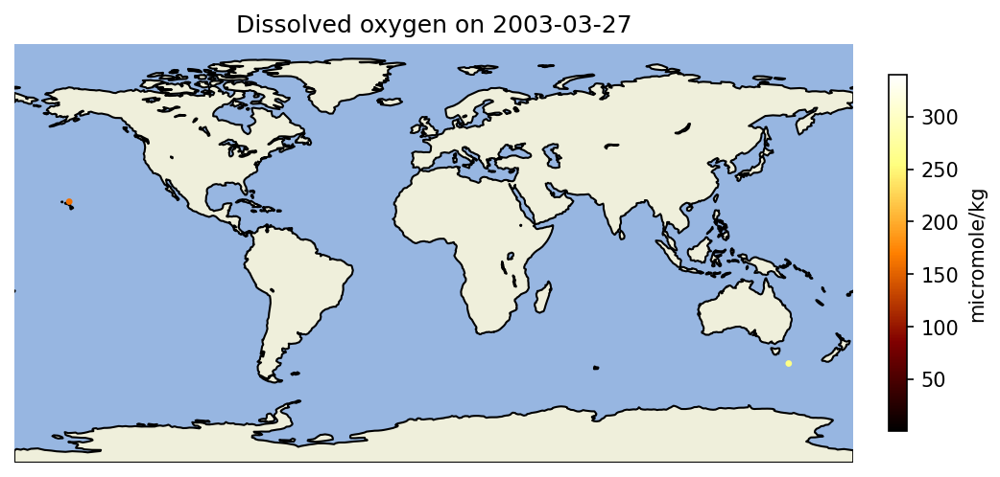

In [4]:
import cartopy
import matplotlib.animation
import matplotlib.pyplot as plt
from matplotlib import colormaps
from datetime import datetime, timedelta
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()

# Group by platform number and time, and aggregate by averaging over oxygen amount and lat/lon coordinates
# The result is a dataframe ordered by platform number first and time second. For each entry we have the average doxy, lat, lon.
df_grouped = df.groupby(['PLATFORM_NUMBER', 'JULD']).agg({
    'DOXY_ADJUSTED': 'mean',
    'LATITUDE': 'mean',
    'LONGITUDE': 'mean'
}).reset_index()

# Start and end of animation
start_t = df_grouped['JULD'].min()
end_t = df_grouped['JULD'].max()

# Setting number of frames for animation
nb_frames = 40

# Setting values of each time to plot
datetime_values = pd.date_range(start=start_t, end=end_t, periods=nb_frames+1).values

# Setting up plot
proj = cartopy.crs.PlateCarree()
fig = plt.figure(figsize=(8, 6), )
ax = fig.add_subplot(projection=proj, frameon=False)

# Setting up colormap
cbar_min = df['DOXY_ADJUSTED'].quantile(q=0.01)
cbar_max = df['DOXY_ADJUSTED'].quantile(q=0.99)
sc = ax.scatter([], [], c=[], cmap='afmhot', vmin=cbar_min, vmax=cbar_max, transform=cartopy.crs.PlateCarree())
cbar = plt.colorbar(sc, ax=ax, fraction=0.02, pad=0.04)
cbar.set_label('micromole/kg')

# note that update() is passed the current frame number by FuncAnimation()
def update(frame):
    plt.cla()
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.LAND, edgecolor='black')
    ax.add_feature(cartopy.feature.LAKES, edgecolor='black')
    t_i = datetime_values[frame]
    t_ip1 = datetime_values[frame+1]
    timestep_df = df_grouped[(df_grouped['JULD'] >= t_i) & (df_grouped['JULD'] <= t_ip1)]
    timestep_df = timestep_df.groupby(['PLATFORM_NUMBER']).agg({
                                 'DOXY_ADJUSTED': 'mean',
                                 'LATITUDE': 'mean',
                                 'LONGITUDE': 'mean',
                                 'JULD': lambda x: x.tolist()
                                 }).reset_index()
    ax.scatter(timestep_df['LONGITUDE'], timestep_df['LATITUDE'], c=timestep_df['DOXY_ADJUSTED'], 
                s=5, cmap='afmhot', vmin=cbar_min, vmax=cbar_max, transform=cartopy.crs.PlateCarree()
                )
    plt.xlim(-180,180)
    plt.ylim(-90,90)
    plt.title("Dissolved oxygen on " + np.datetime_as_string(t_ip1, unit='D'))
    
matplotlib.animation.FuncAnimation(fig, update, frames=nb_frames)